# Import Library

In [ ]:
!pip install scikit-learn-intelex

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.7/128.7 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 51.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.3/75.3 MB 6.8 MB/s eta 0:00:00


In [ ]:
!pip install missingno

In [ ]:
from sklearnex import patch_sklearn
patch_sklearn()

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as pl
import plotly.graph_objects as gr
from plotly.subplots import make_subplots
import seaborn as sns
import sklearn
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn import ensemble
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
import warnings
import os
from sklearn.preprocessing import LabelEncoder
warnings.filterwarnings("ignore")
%matplotlib inline

# Import Data  - Train and Test sets

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
drive_root = '/content/drive/MyDrive/'
traindata=pd.read_csv("/content/drive/MyDrive/train.csv")
testdata = pd.read_csv('/content/drive/MyDrive/test.csv')

Mounted at /content/drive


In [ ]:
traindata.head()

,seat,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,70172,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,5047,Male,disloyal Customer,25,Business travel,Business,235,3,2,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,110028,Female,Loyal Customer,26,Business travel,Business,1142,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,24026,Female,Loyal Customer,25,Business travel,Business,562,2,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,119299,Male,Loyal Customer,61,Business travel,Business,214,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [ ]:
# Load or read in original dataset
testdata.head()

,seat,id,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,19556,Female,Loyal Customer,52,Business travel,Eco,160,5,4,...,5,5,5,5,2,5,5,50,44.0,satisfied
1,1,90035,Female,Loyal Customer,36,Business travel,Business,2863,1,1,...,4,4,4,4,3,4,5,0,0.0,satisfied
2,2,12360,Male,disloyal Customer,20,Business travel,Eco,192,2,0,...,2,4,1,3,2,2,2,0,0.0,neutral or dissatisfied
3,3,77959,Male,Loyal Customer,44,Business travel,Business,3377,0,0,...,1,1,1,1,3,1,4,0,6.0,satisfied
4,4,36875,Female,Loyal Customer,49,Business travel,Eco,1182,2,3,...,2,2,2,2,4,2,4,0,20.0,satisfied


## Creating source data backups

In [ ]:
#Here we are making copy of both dataset Train and test for preprocessing and combining both of the in one variable
preprocessed_train_data = traindata.copy()
preprocessed_test_data = testdata.copy()
all_data = pd.concat([preprocessed_train_data, preprocessed_test_data])

In [ ]:
all_data.shape

(129880, 25)

# Data Explore- EDA

## Exploring data

In [ ]:
print('Type of Datasource object',type(traindata))
print('Shape of training data',traindata.shape)
print('Columns in training data',traindata.columns)
print(traindata.describe())

Type of Datasource object <class 'pandas.core.frame.DataFrame'>
Shape of training data (103904, 25)
Columns in training data Index(['seat', 'id', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')
                seat             id            Age  Flight Distance  \
count  103904.000000  103904.000000  103904.000000    103904.000000   
mean    51951.500000   64924.210502      39.379706      1189.448375   
std     29994.645522   37463.812252      15.114964       997.147281   
min         0.000000       1.000000       7.00

In [ ]:
print('Type of Datasource object',type(testdata))
print('Shape of training data',testdata.shape)
print('Columns in training data',testdata.columns)
print(traindata.describe())
print(traindata.info())

Type of Datasource object <class 'pandas.core.frame.DataFrame'>
Shape of training data (25976, 25)
Columns in training data Index(['seat', 'id', 'Gender', 'Customer Type', 'Age', 'Type of Travel',
       'Class', 'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes', 'Arrival Delay in Minutes',
       'satisfaction'],
      dtype='object')
                seat             id            Age  Flight Distance  \
count  103904.000000  103904.000000  103904.000000    103904.000000   
mean    51951.500000   64924.210502      39.379706      1189.448375   
std     29994.645522   37463.812252      15.114964       997.147281   
min         0.000000       1.000000       7.000

In [ ]:
traindata = traindata.drop(columns=['id'], axis=0)
testdata = testdata.drop(columns=['id'], axis=0)

## Handling Missing Values

In [ ]:
#missing values
print('Missing values', traindata.isnull().sum())

Missing values seat                                   0
Gender                                 0
Customer Type                          0
Age                                    0
Type of Travel                         0
Class                                  0
Flight Distance                        0
Inflight wifi service                  0
Departure/Arrival time convenient      0
Ease of Online booking                 0
Gate location                          0
Food and drink                         0
Online boarding                        0
Seat comfort                           0
Inflight entertainment                 0
On-board service                       0
Leg room service                       0
Baggage handling                       0
Checkin service                        0
Inflight service                       0
Cleanliness                            0
Departure Delay in Minutes             0
Arrival Delay in Minutes             310
satisfaction                           0
d

In [ ]:
#imputing missing values
traindata = traindata.fillna(0)

In [ ]:
traindata.head()

,seat,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,Male,Loyal Customer,13,Personal Travel,Eco Plus,460,3,4,3,...,5,4,3,4,4,5,5,25,18.0,neutral or dissatisfied
1,1,Male,disloyal Customer,25,Business travel,Business,235,3,2,3,...,1,1,5,3,1,4,1,1,6.0,neutral or dissatisfied
2,2,Female,Loyal Customer,26,Business travel,Business,1142,2,2,2,...,5,4,3,4,4,4,5,0,0.0,satisfied
3,3,Female,Loyal Customer,25,Business travel,Business,562,2,5,5,...,2,2,5,3,1,4,2,11,9.0,neutral or dissatisfied
4,4,Male,Loyal Customer,61,Business travel,Business,214,3,3,3,...,3,3,4,4,3,3,3,0,0.0,satisfied


In [ ]:
print('Missing values', testdata.isnull().sum())

Missing values seat                                  0
Gender                                0
Customer Type                         0
Age                                   0
Type of Travel                        0
Class                                 0
Flight Distance                       0
Inflight wifi service                 0
Departure/Arrival time convenient     0
Ease of Online booking                0
Gate location                         0
Food and drink                        0
Online boarding                       0
Seat comfort                          0
Inflight entertainment                0
On-board service                      0
Leg room service                      0
Baggage handling                      0
Checkin service                       0
Inflight service                      0
Cleanliness                           0
Departure Delay in Minutes            0
Arrival Delay in Minutes             83
satisfaction                          0
dtype: int64


In [ ]:
#imputing missing values
testdata = testdata.fillna(0)

## Handling categorical data columns

In [ ]:
categorical_columns = traindata.select_dtypes(include=['object']).columns
print(categorical_columns)

Index(['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction'], dtype='object')


In [ ]:
print('Unique values in Gender',traindata['Gender'].unique())
print('Unique values in Customer Type',traindata['Customer Type'].unique())
print('Unique values in Type of Travel',traindata['Type of Travel'].unique())
print('Unique values in Class',traindata['Class'].unique())
print('Unique values in satisfaction',traindata['satisfaction'].unique())

Unique values in Gender ['Male' 'Female']
Unique values in Customer Type ['Loyal Customer' 'disloyal Customer']
Unique values in Type of Travel ['Personal Travel' 'Business travel']
Unique values in Class ['Eco Plus' 'Business' 'Eco']
Unique values in satisfaction ['neutral or dissatisfied' 'satisfied']


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

ordinal_mapping = {'Personal Travel': 0, 'Business travel': 1}
traindata['Type of Travel'] = traindata['Type of Travel'].map(ordinal_mapping)

ordinal_mapping_class = {'Eco': 0, 'Eco Plus': 1, 'Business': 2}
traindata['Class'] = traindata['Class'].map(ordinal_mapping_class)

traindata['Gender'] = label_encoder.fit_transform(traindata['Gender'])
traindata['Customer Type'] = label_encoder.fit_transform(traindata['Customer Type'])

traindata['satisfaction'] = traindata['satisfaction'].apply(lambda x: 0 if x == 'neutral or dissatisfied' else 1)


In [ ]:
print('Unique values in Gender',traindata['Gender'].unique())
print('Unique values in Customer Type',traindata['Customer Type'].unique())
print('Unique values in Type of Travel',traindata['Type of Travel'].unique())
print('Unique values in Class',traindata['Class'].unique())
print('Unique values in satisfaction',traindata['satisfaction'].unique())

Unique values in Gender [1 0]
Unique values in Customer Type [0 1]
Unique values in Type of Travel [0 1]
Unique values in Class [1 2 0]
Unique values in satisfaction [0 1]


In [ ]:
# encoding on test data
label_encoder = LabelEncoder()

ordinal_mapping = {'Personal Travel': 0, 'Business travel': 1}
testdata['Type of Travel'] = testdata['Type of Travel'].map(ordinal_mapping)

ordinal_mapping_class = {'Eco': 0, 'Eco Plus': 1, 'Business': 2}
testdata['Class'] = testdata['Class'].map(ordinal_mapping_class)

testdata['Gender'] = label_encoder.fit_transform(testdata['Gender'])
testdata['Customer Type'] = label_encoder.fit_transform(testdata['Customer Type'])

testdata['satisfaction'] = testdata['satisfaction'].apply(lambda x: 0 if x == 'neutral or dissatisfied' else 1)


In [ ]:
traindata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103904 entries, 0 to 103903
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   seat                               103904 non-null  int64  
 1   Gender                             103904 non-null  int64  
 2   Customer Type                      103904 non-null  int64  
 3   Age                                103904 non-null  int64  
 4   Type of Travel                     103904 non-null  int64  
 5   Class                              103904 non-null  int64  
 6   Flight Distance                    103904 non-null  int64  
 7   Inflight wifi service              103904 non-null  int64  
 8   Departure/Arrival time convenient  103904 non-null  int64  
 9   Ease of Online booking             103904 non-null  int64  
 10  Gate location                      103904 non-null  int64  
 11  Food and drink                     1039

In [ ]:
traindata.drop(categorical_columns, axis=1).describe().T

,count,mean,std,min,25%,50%,75%,max
seat,103904.0,51951.500000,29994.645522,0.0,25975.75,51951.5,77927.25,103903.0
Age,103904.0,39.379706,15.114964,7.0,27.00,40.0,51.00,85.0
Flight Distance,103904.0,1189.448375,997.147281,31.0,414.00,843.0,1743.00,4983.0
Inflight wifi service,103904.0,2.729683,1.327829,0.0,2.00,3.0,4.00,5.0
Departure/Arrival time convenient,103904.0,3.060296,1.525075,0.0,2.00,3.0,4.00,5.0
Ease of Online booking,103904.0,2.756901,1.398929,0.0,2.00,3.0,4.00,5.0
Gate location,103904.0,2.976883,1.277621,0.0,2.00,3.0,4.00,5.0
Food and drink,103904.0,3.202129,1.329533,0.0,2.00,3.0,4.00,5.0
Online boarding,103904.0,3.250375,1.349509,0.0,2.00,3.0,4.00,5.0
Seat comfort,103904.0,3.439396,1.319088,0.0,2.00,4.0,5.00,5.0


## Distribution plot of all features in the data set

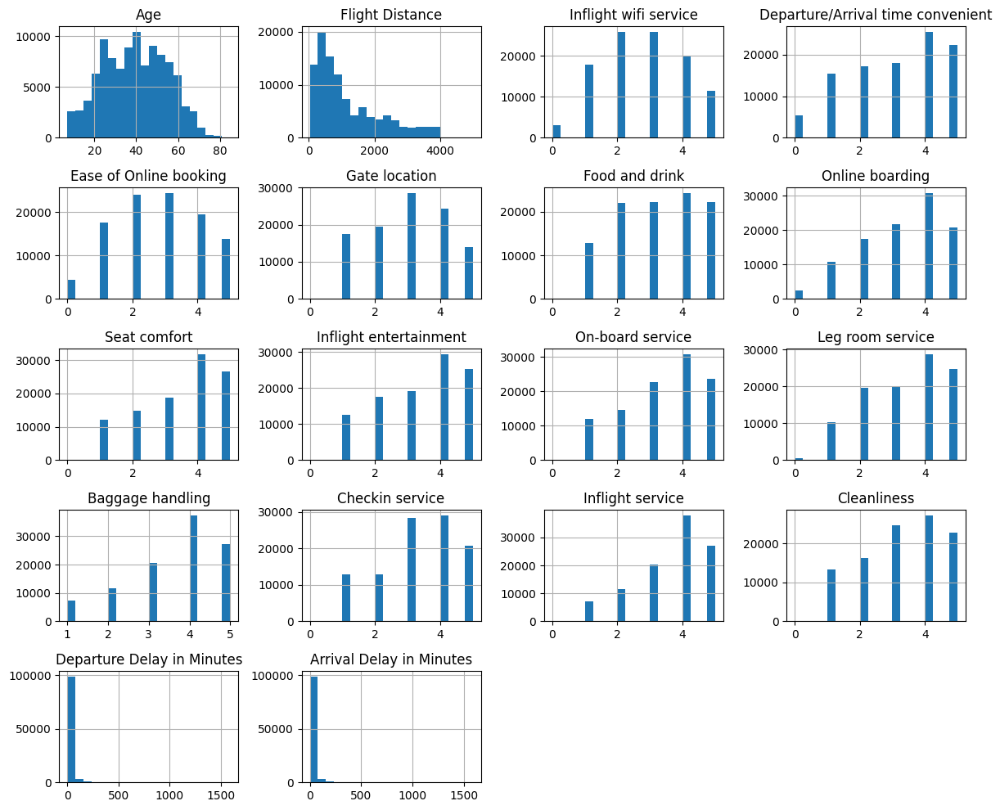

In [ ]:
traindata.drop(categorical_columns.append(pd.Index(['seat'])), axis=1).hist(bins=20, figsize=(12, 10))
plt.tight_layout()
plt.show()

In [ ]:
for column in traindata.select_dtypes(include=['int64', 'float64']).columns:
    fig=pl.histogram(traindata,x=column,
                 color='satisfaction',
                 barmode='group',
                 color_discrete_map={'satisfied':'teal','neutral or dissatisfied':'Cyan'})


    fig.update_layout(title='<b>Distribution of Satisfied and Dissatisfied passengers over the classess<b>',
                 title_font={'size':23},
                 showlegend=True)

    fig.update_traces(marker_line_color='Black',marker_line_width=0.5,opacity=0.8)
    fig.update_yaxes(showgrid=True)
    fig.show()

In [ ]:
categorical_columns

Index(['Gender', 'Customer Type', 'Type of Travel', 'Class', 'satisfaction'], dtype='object')

In [ ]:
traindata

,seat,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
0,0,1,0,13,0,1,460,3,4,3,...,5,4,3,4,4,5,5,25,18.0,0
1,1,1,1,25,1,2,235,3,2,3,...,1,1,5,3,1,4,1,1,6.0,0
2,2,0,0,26,1,2,1142,2,2,2,...,5,4,3,4,4,4,5,0,0.0,1
3,3,0,0,25,1,2,562,2,5,5,...,2,2,5,3,1,4,2,11,9.0,0
4,4,1,0,61,1,2,214,3,3,3,...,3,3,4,4,3,3,3,0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
103899,103899,0,1,23,1,0,192,2,1,2,...,2,3,1,4,2,3,2,3,0.0,0
103900,103900,1,0,49,1,2,2347,4,4,4,...,5,5,5,5,5,5,4,0,0.0,1
103901,103901,1,1,30,1,2,1995,1,1,1,...,4,3,2,4,5,5,4,7,14.0,0
103902,103902,0,1,22,1,0,1000,1,1,1,...,1,4,5,1,5,4,1,0,0.0,0


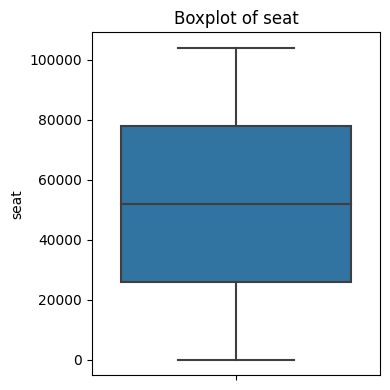

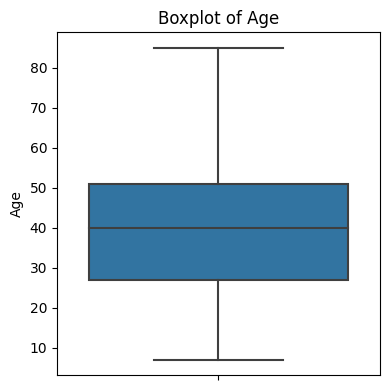

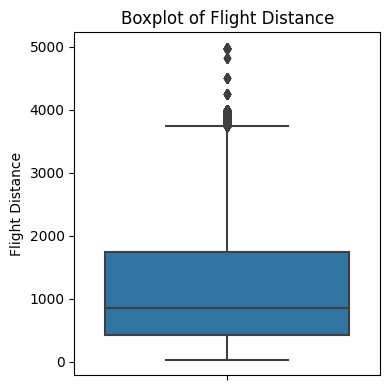

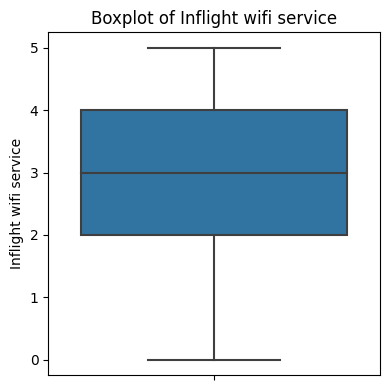

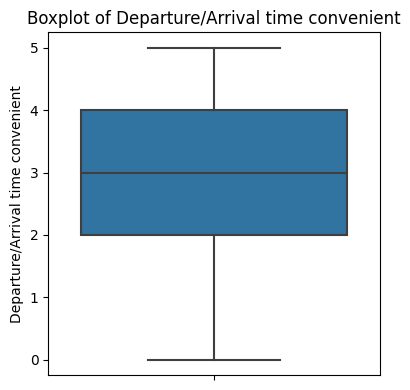

...

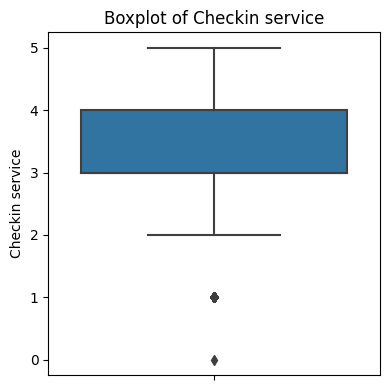

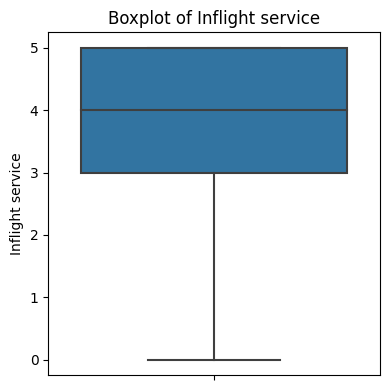

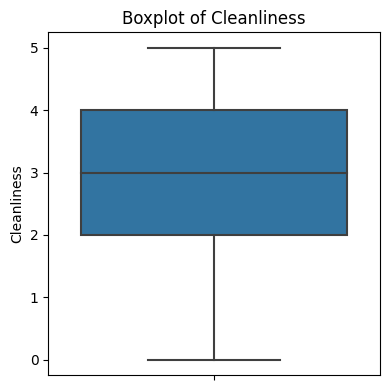

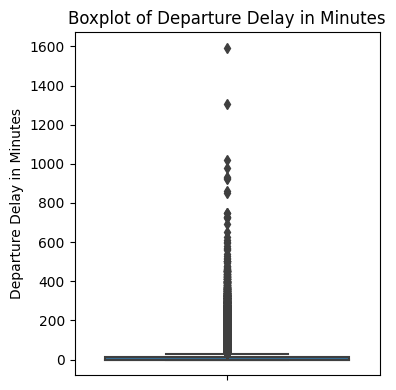

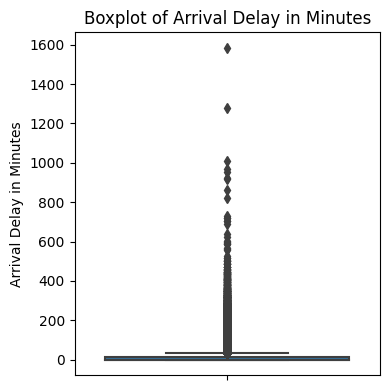

In [ ]:
for column in traindata.columns.drop(categorical_columns):
    plt.figure(figsize=(4, 4))
    sns.boxplot(data=traindata, y=column)
    plt.title(f'Boxplot of {column}')
    plt.tight_layout()
    plt.show()

## Label column count check

In [ ]:
traindata['satisfaction']

0         0
1         0
2         1
3         0
4         1
         ..
103899    0
103900    1
103901    0
103902    0
103903    0
Name: satisfaction, Length: 103904, dtype: int64

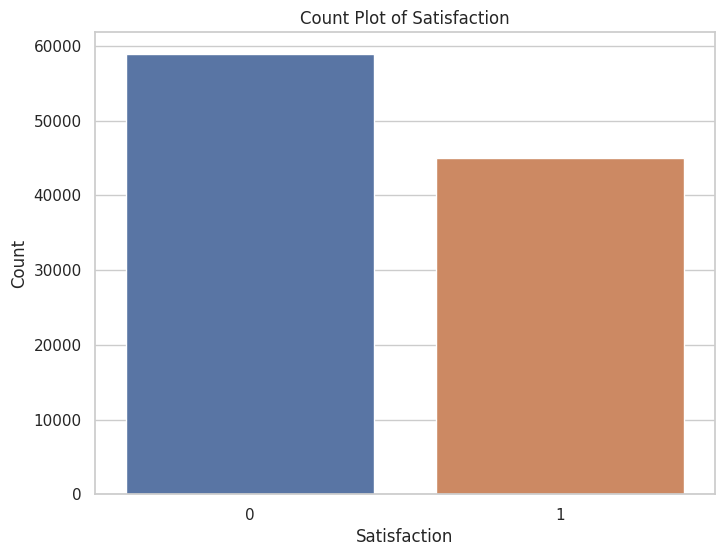

In [ ]:
sns.set(style="whitegrid")
plt.figure(figsize=(8, 6))
sns.countplot(data=traindata, x='satisfaction')
plt.title('Count Plot of Satisfaction')
plt.xlabel('Satisfaction')
plt.ylabel('Count')
plt.show()

([<matplotlib.patches.Wedge at 0x7cd083e89180>,
 [Text(-0.22870506272227167, 1.0759618925804026, 'Satisfied'),
  Text(0.228705062722272, -1.0759618925804026, 'Neutral or dissatisfied')],
 [Text(-0.12474821603032998, 0.5868883050438559, '56.7%'),
  Text(0.12474821603033018, -0.5868883050438559, '43.3%')])

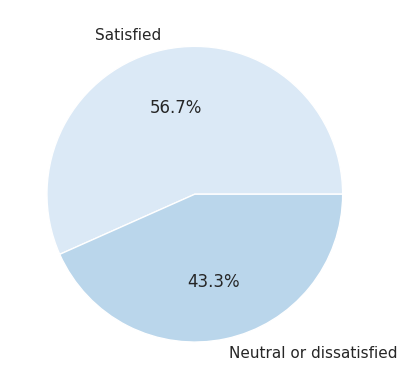

In [ ]:
plt.pie(traindata.satisfaction.value_counts(),
        labels = ["Satisfied","Neutral or dissatisfied"], colors = sns.color_palette("Blues"), autopct = '%1.1f%%')

(-1.0999999980597919,
 1.099999999907609,
 -1.0999918660562475,
 1.099998496231309)

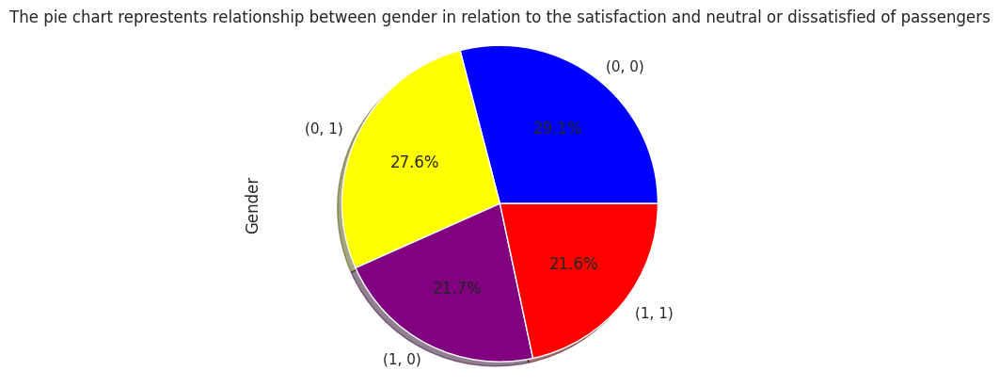

In [ ]:
colors = ['blue', 'yellow','purple', 'red']
traindata.groupby('satisfaction')['Gender'].value_counts().plot.pie(autopct ='%1.1f%%',shadow=True,colors=colors)
plt.title('The pie chart represtents relationship between gender in relation to the satisfaction and neutral or dissatisfied of passengers')
plt.axis('equal')

## Correlation coefficients

In [ ]:
corr_mat = traindata.drop('seat', axis=1).corr().round(2)
corr_mat

,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,...,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,Cleanliness,Departure Delay in Minutes,Arrival Delay in Minutes,satisfaction
Gender,1.00,-0.03,0.01,-0.01,0.01,0.01,0.01,0.01,0.01,0.00,...,0.01,0.01,0.03,0.04,0.01,0.04,0.01,0.00,0.00,0.01
Customer Type,-0.03,1.00,-0.28,0.31,-0.11,-0.23,-0.01,-0.21,-0.02,0.01,...,-0.11,-0.06,-0.05,0.02,-0.03,0.02,-0.08,0.00,0.00,-0.19
Age,0.01,-0.28,1.00,0.05,0.14,0.10,0.02,0.04,0.02,-0.00,...,0.08,0.06,0.04,-0.05,0.04,-0.05,0.05,-0.01,-0.01,0.14
Type of Travel,-0.01,0.31,0.05,1.00,0.55,0.27,0.11,-0.26,0.13,0.03,...,0.15,0.06,0.14,0.03,-0.02,0.02,0.08,0.01,0.01,0.45
Class,0.01,-0.11,0.14,0.55,1.00,0.45,0.04,-0.09,0.11,0.00,...,0.19,0.21,0.20,0.16,0.15,0.16,0.14,-0.01,-0.01,0.49
Flight Distance,0.01,-0.23,0.10,0.27,0.45,1.00,0.01,-0.02,0.07,0.00,...,0.13,0.11,0.13,0.06,0.07,0.06,0.09,0.00,-0.00,0.30
Inflight wifi service,0.01,-0.01,0.02,0.11,0.04,0.01,1.00,0.34,0.72,0.34,...,0.21,0.12,0.16,0.12,0.04,0.11,0.13,-0.02,-0.02,0.28
Departure/Arrival time convenient,0.01,-0.21,0.04,-0.26,-0.09,-0.02,0.34,1.00,0.44,0.44,...,-0.00,0.07,0.01,0.07,0.09,0.07,0.01,0.00,-0.00,-0.05
Ease of Online booking,0.01,-0.02,0.02,0.13,0.11,0.07,0.72,0.44,1.00,0.46,...,0.05,0.04,0.11,0.04,0.01,0.04,0.02,-0.01,-0.01,0.17
Gate location,0.00,0.01,-0.00,0.03,0.00,0.00,0.34,0.44,0.46,1.00,...,0.00,-0.03,-0.01,0.00,-0.04,0.00,-0.00,0.01,0.01,0.00


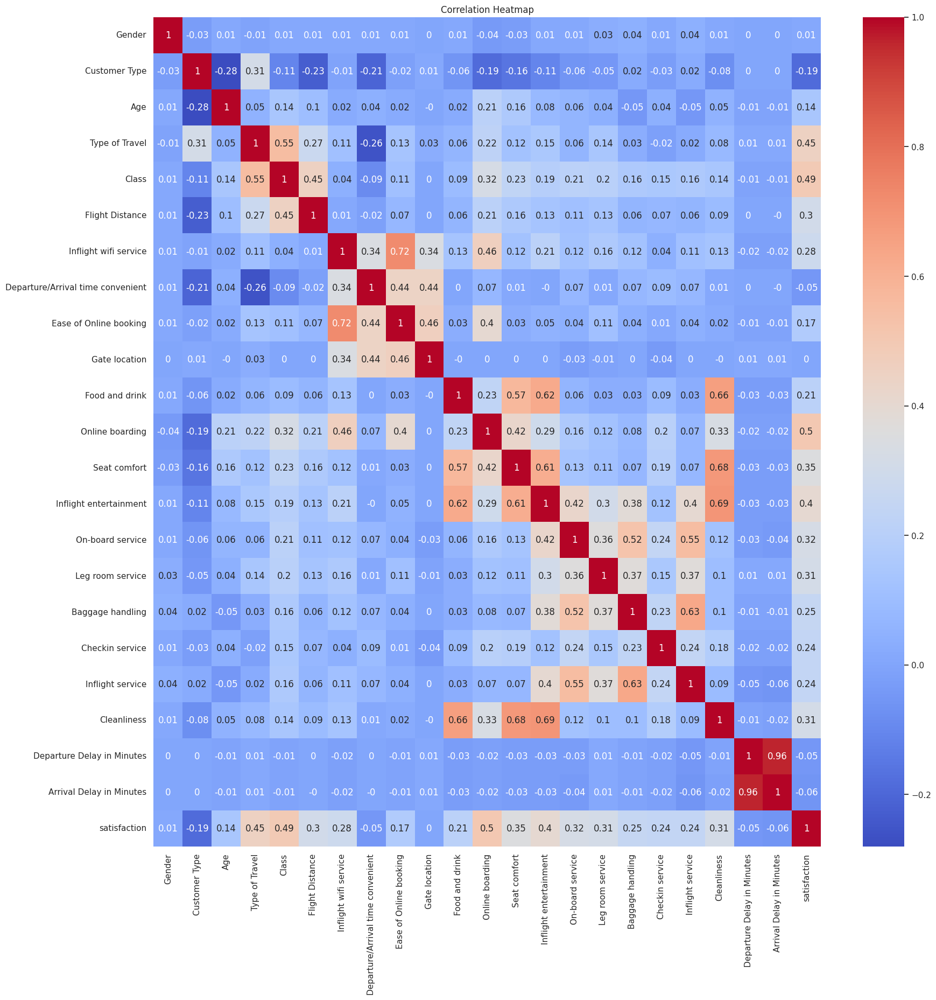

In [ ]:
plt.figure(figsize=(20, 20))
sns.heatmap(corr_mat, cmap='coolwarm', annot= True)
plt.title('Correlation Heatmap')
plt.show()

You can see that there is a strong correlation between the features 'Departure delay in minutes' and 'Arrival delay in minutes'. The value of the correlation coefficient reaches the following value:

In [ ]:
fig=pl.histogram(traindata,x='Class',
                 color='satisfaction',
                 barmode='group',
                 color_discrete_map={'satisfied':'teal','neutral or dissatisfied':'Cyan'})


fig.update_layout(title='<b>Distribution of Satisfied and Dissatisfied passengers over the classess<b>',
                 title_font={'size':23},

                 showlegend=True)

fig.update_traces(marker_line_color='Black',marker_line_width=0.5,opacity=0.8)
fig.update_yaxes(showgrid=True)

In [ ]:
fig1 = make_subplots(rows=1, cols=2,
                    specs=[[{'type':'domain'}, {'type':'domain'}],
                          ],subplot_titles=['Customer Type distribution','Type of Travel distribution'])


fig1.add_trace(
    gr.Pie(
        labels=traindata['Type of Travel'],
        hole=.3,
        title='Type of Travel',
        titlefont={'color':None, 'size': 15},

        ),
    row=1,col=2
    )

fig1.add_trace(
    gr.Pie(
        labels=traindata['Customer Type'],
        hole=.3,
        title='Customer Type',
        titlefont={'color':None, 'size': 15},

        ),
    row=1,col=1
    )

fig1.update_traces(
    hoverinfo='label+value',
    textinfo='label+percent',
    textfont_size=11,
    marker=dict(
        colors=['yellowgreen', 'forestgreen'],
        )
    )
fig1.update_layout(title='<b> Representation for Type of Travel and Customer Type <b>',
                 title_font={'size':20},
                 paper_bgcolor='white',
                 plot_bgcolor='white',
                 showlegend=True)
fig1.update_traces(opacity=0.8)

In [ ]:
fig=pl.scatter(traindata,x='Departure Delay in Minutes',
               y='Arrival Delay in Minutes',
               color='satisfaction',
               color_discrete_map={'satisfied':'#66C2A5','neutral or dissatisfied':'lightblue'})


fig.update_layout(title='<b>Distribution of Departure Delay in Minutes over Arrival Delay in Minutes According to satisfaction  <b>',
                 title_font={'size':17},
                 paper_bgcolor='white',
                 plot_bgcolor='white',
                 showlegend=True)

fig.update_xaxes(showgrid=False)
fig.update_yaxes(showgrid=False)

In [ ]:
sat =traindata[traindata['satisfaction']=='satisfied']
neutral_or_not_sat=traindata[traindata['satisfaction']=='neutral or dissatisfied']


fig=gr.Figure()

fig.add_trace(gr.Violin(x=sat['Age'],line_color='lightseagreen',y0=0,name='satisfied passengers age '))

fig.add_trace(gr.Violin(x=neutral_or_not_sat['Age'],line_color='red',y0=0,name='neutral or dissatisfied passengers age'))

fig.update_traces(orientation='h',side='positive',meanline_visible=True)

fig.update_layout(title='<b>Distribution of satisfied and neutral or dissatisfied passengers over age<b>',
                 titlefont={'size':19},
                 xaxis_zeroline=False,
                 paper_bgcolor='lightgrey',
                 plot_bgcolor='lightgrey')

fig.update_xaxes(showgrid=False,title='<b>age<b>')
fig.update_traces(opacity=0.7)

In [ ]:
fig=make_subplots(rows=3,cols=2)

fig.add_trace(gr.Bar(x=traindata['Gate location'].value_counts().index,
                     y=traindata['Gate location'].value_counts(),
                     marker_color='#E47575'
                    ),
              row=3, col=2
             )
fig.add_trace(gr.Bar(x=traindata['Online boarding'].value_counts().index,
                    y= traindata['Online boarding'].value_counts(),
                     marker_color='#75DCE4 '
                    ),
              row=2, col=2
             )

fig.add_trace(gr.Bar(x=traindata['Departure/Arrival time convenient'].value_counts().index,
                     y=traindata['Departure/Arrival time convenient'].value_counts(),
                     marker_color=' #75E4C2'
                    ),
              row=1, col=2
             )

fig.add_trace(gr.Bar(x=traindata['Ease of Online booking'].value_counts().index,
                     y=traindata['Ease of Online booking'].value_counts(),
                     marker_color='#E4BA75 '
                    ),
              row=2, col=1
             )

fig.add_trace(gr.Bar(x=traindata['Inflight wifi service'].value_counts().index,
                     y=traindata['Inflight wifi service'].value_counts(),
                     marker_color='#BAE475  '
                    ),
              row=3, col=1
             )

fig.add_trace(gr.Bar(x=traindata['Food and drink'].value_counts().index,
                    y= traindata['Food and drink'].value_counts(),
                     marker_color='#E49A75  '
                    ),
              row=1, col=1
             )

fig.update_xaxes(title_text="Gate location", showgrid=False, row=3, col=2)
fig.update_xaxes(title_text="Online boarding", showgrid=False, row=2, col=2)
fig.update_xaxes(title_text="Departure/Arrival time convenient", showgrid=False, row=1, col=2)
fig.update_xaxes(title_text="Ease of Online booking", showgrid=False, row=2, col=1)
fig.update_xaxes(title_text="Inflight wifi service", showgrid=False, row=3, col=1)
fig.update_xaxes(title_text="Food and drink", showgrid=False, row=1, col=1)


fig.update_layout(title='<b>Representation of important features affect passengers satisfictions<b>',
                 title_font={'size':20},
                 showlegend=False,
                 height=1200)

Here we going to look Distribution of Baggage handling over flight Distance

In [ ]:
# Sort the data by 'Baggage handling' in ascending order
sorted_data = traindata.sort_values(by='Baggage handling')

# Create violin plot with custom colors and sorted data
fig=pl.violin(traindata,x='Baggage handling',
              y='Flight Distance',
              color='Baggage handling',
              box=True,

               color_discrete_sequence=['#1f77b4', '#ff7f0e', '#d62728', '#2ca02c', '#9467bd'])

fig.update_layout(title='<b>Distribution of Baggage handling over flight Distance<b>',
                 title_font={'size':20},
                 showlegend=True)
fig.show()

Text(0.5, 1.0, 'Representation of class by satisfaction according to the mean of Flight Distance')

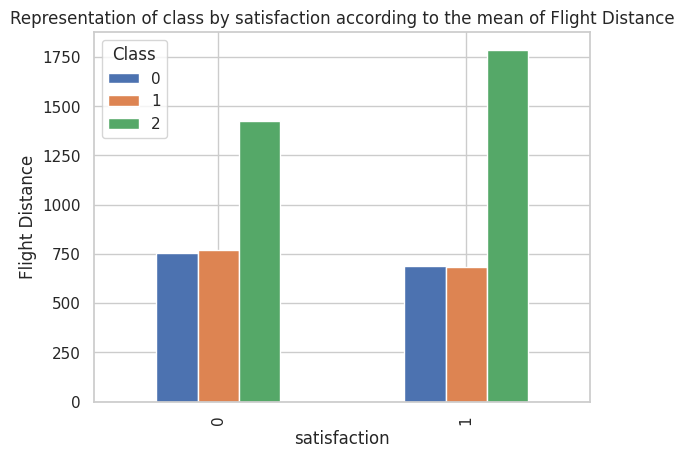

In [ ]:
traindata.pivot_table(index='satisfaction',columns='Class',values='Flight Distance',aggfunc='mean').plot.bar()
plt.ylabel('Flight Distance')
plt.title('Representation of class by satisfaction according to the mean of Flight Distance')

Text(0.5, 1.0, 'Data correlations')

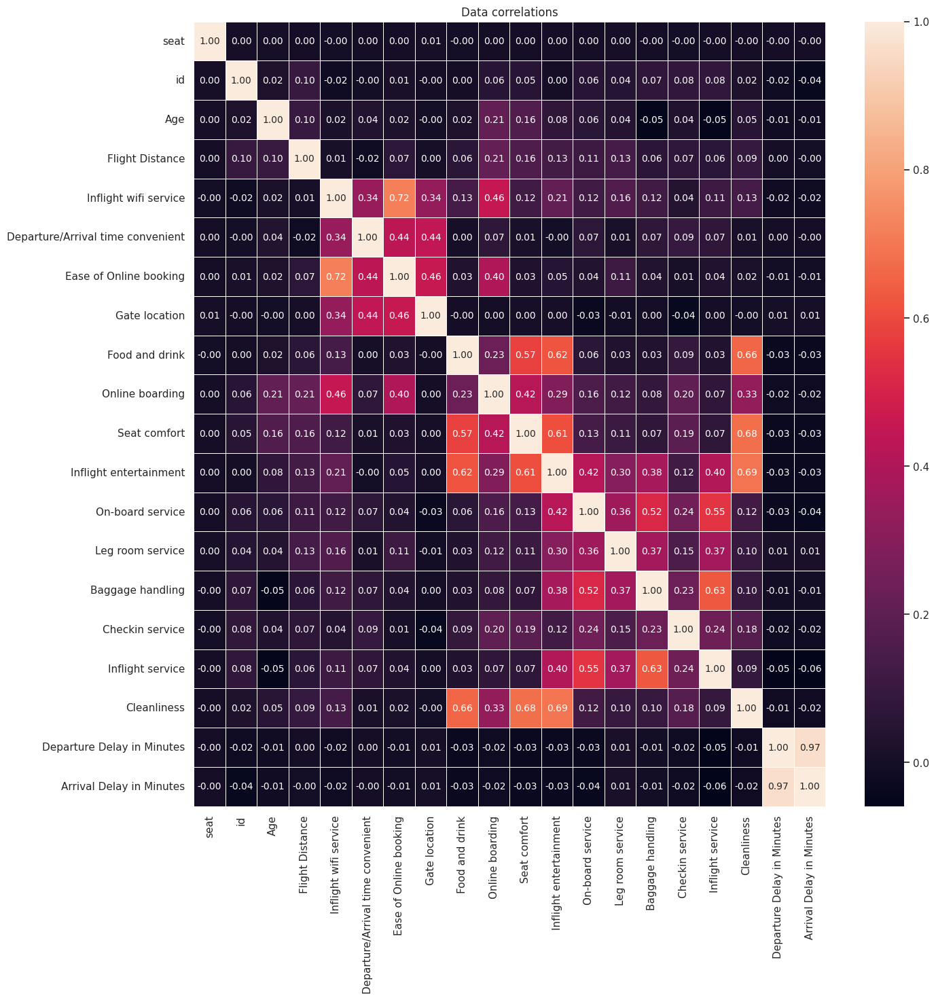

In [ ]:
correlation=preprocessed_train_data.corr()
plt.figure(figsize=(15,15))
sns.heatmap(correlation,annot=True,fmt='.2f',annot_kws={'size': 10},linewidths=0.5)
plt.title("Data correlations")

In [ ]:
traindata.shape

(103904, 24)

# Data Preprocessing

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(traindata)
traindata = pd.DataFrame(scaled_data, columns=traindata.columns)
scaled_data = scaler.transform(testdata)
testdata = pd.DataFrame(scaled_data, columns=testdata.columns)

In [ ]:
from sklearn.model_selection import train_test_split
X = traindata.drop(columns='satisfaction')
y = traindata['satisfaction']

# Split the data into training and validation sets
x_train, x_val, y_train, y_val = train_test_split(X, y, test_size=0.1, random_state=42)

x_test=testdata.drop(['satisfaction'],axis=1)
y_test=testdata['satisfaction']

In [ ]:
from sklearn.feature_selection import SelectKBest, chi2
k = 20
selector = SelectKBest(chi2, k=k)
x_train = selector.fit_transform(x_train, y_train)
x_val= selector.fit_transform(x_val, y_val)
x_test= selector.fit_transform(x_test, y_test)

In [ ]:
selector.get_feature_names_out()

array(['Customer Type', 'Age', 'Type of Travel', 'Class',
       'Flight Distance', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'Cleanliness', 'Departure Delay in Minutes',
       'Arrival Delay in Minutes'], dtype=object)

In [ ]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.4/484.4 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.4/153.4 kB 9.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.4/73.4 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.5/17.5 MB 72.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.0/44.0 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 72.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 79.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 85.1 MB/s eta 0:0

In [ ]:
from pycaret.classification import *
s=setup(traindata,target='satisfaction')

,Description,Value
0,Session id,7323
1,Target,satisfaction
2,Target type,Binary
3,Original data shape,"(103904, 24)"
4,Transformed data shape,"(103904, 24)"
5,Transformed train set shape,"(72732, 24)"
6,Transformed test set shape,"(31172, 24)"
7,Numeric features,23
8,Preprocess,True
9,Imputation type,simple


# Model Building

In [ ]:
!pip install xgboost-gpu
from xgboost import XGBClassifier

ERROR: Could not find a version that satisfies the requirement xgboost-gpu (from versions: none)
ERROR: No matching distribution found for xgboost-gpu


## Logistic Regression

In [ ]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
param_grid = {
    'penalty': ['l1', 'l2'],
    'C': [0.1, 1, 10],
    'solver': ['liblinear', 'saga'],
    'max_iter': [100, 500, 1000],
}
grid_search = GridSearchCV(estimator=lr, param_grid=param_grid, cv=3)
grid_search.fit(x_train, y_train)
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

Best Parameters: {'C': 1, 'max_iter': 100, 'penalty': 'l1', 'solver': 'liblinear'}
Best Score: 0.8748409312074257


In [ ]:
lr = LogisticRegression(C =0.1, max_iter = 1000, penalty ='l1' ,solver ='liblinear')
lr.fit(x_train, y_train)

LogisticRegression(C=0.1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l1',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

### Evaluating Model on valid

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

# Calculate metrics
y_val_pred = lr.predict(x_val)
cm = confusion_matrix(y_val, y_val_pred)
accuracy_LR = accuracy_score(y_val, y_val_pred)
precision = precision_score(y_val, y_val_pred)
recall = recall_score(y_val, y_val_pred)
f1 = f1_score(y_val, y_val_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_val_prob = lr.predict_proba(x_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_val_prob)
auc = roc_auc_score(y_val, y_val_prob)

# Print the metrics
print("Accuracy:", accuracy_LR)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.8741218362044076
Precision: 0.8721926371845334
Recall: 0.8328543002432014
F1 Score: 0.8520696674960416
Specificity: 0.9059304703476483
AUC: 0.9250295882244518


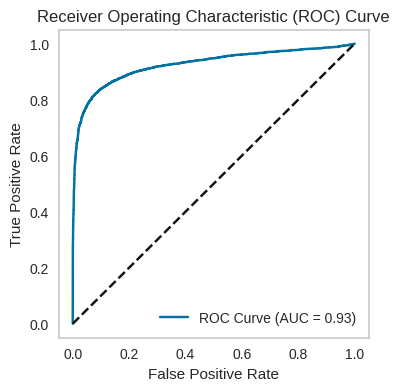

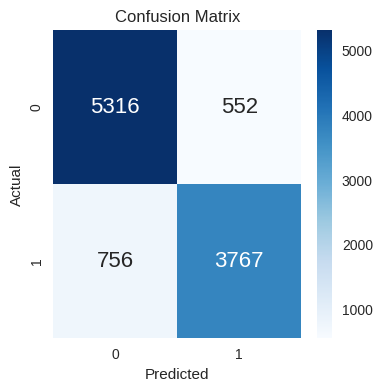

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Evaluating Model on test

In [ ]:
# Calculate metrics
y_test_pred = lr.predict(x_test)
cm = confusion_matrix(y_test, y_test_pred)
accuracy_LR = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_test_prob = lr.predict_proba(x_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
auc = roc_auc_score(y_test, y_test_prob)

# Print the metrics
print("Accuracy:", accuracy_LR)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.8715352633199877
Precision: 0.8677060539752006
Recall: 0.8346049285275805
F1 Score: 0.850833668588798
Specificity: 0.9004323063199067
AUC: 0.9255288938705974


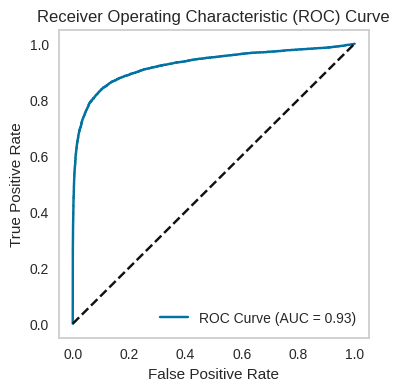

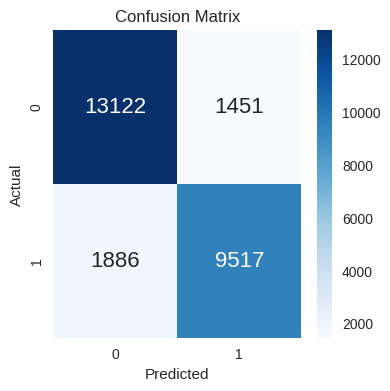

In [ ]:
# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## Support Vector Classifier

In [ ]:
!pip install scikit-cuda

In [ ]:
from sklearn.svm import SVC
svc = SVC()
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly'],
    'max_iter': [100, 500, 1000],
    'gamma': ['scale', 'auto', 0.1, 1],
}
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=3, n_jobs=-1)
grid_search.fit(x_val, y_val)
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)


Best Parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'rbf', 'max_iter': 100}
Best Score: 0.9437012233360164


In [ ]:
svc = SVC(C= 10, gamma='scale',kernel= 'rbf', max_iter= 100, probability=True)
svc.fit(x_train, y_train)

SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=100, probability=True, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

### Evaluating Model on valid

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

# Calculate metrics
y_val_pred = svc.predict(x_val)
cm = confusion_matrix(y_val, y_val_pred)
accuracy = accuracy_score(y_val, y_val_pred)
precision = precision_score(y_val, y_val_pred)
recall = recall_score(y_val, y_val_pred)
f1 = f1_score(y_val, y_val_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_val_prob = svc.predict_proba(x_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_val_prob)
auc = roc_auc_score(y_val, y_val_prob)

# Print the metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9573669521701472
Precision: 0.9661791590493601
Recall: 0.9347778023435773
F1 Score: 0.9502191257444657
Specificity: 0.9747784594410361
AUC: 0.9912217958624261


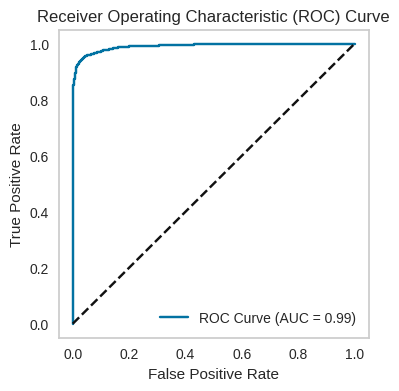

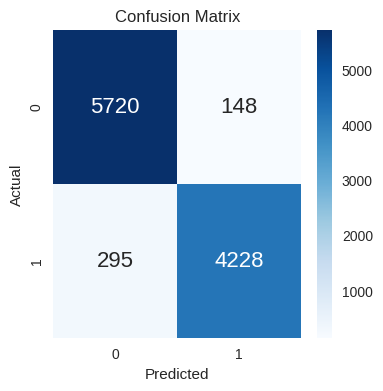

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Evaluating Model on test

In [ ]:
# Calculate metrics
y_test_pred = svc.predict(x_test)
cm = confusion_matrix(y_test, y_test_pred)
accuracy_sv = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_test_prob = svc.predict_proba(x_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
auc = roc_auc_score(y_test, y_test_prob)

# Print the metrics
print("Accuracy:", accuracy_sv)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9587311364336311
Precision: 0.9664108352144469
Recall: 0.9386126457949663
F1 Score: 0.9523089242815197
Specificity: 0.9744733411102724
AUC: 0.9909051924665451


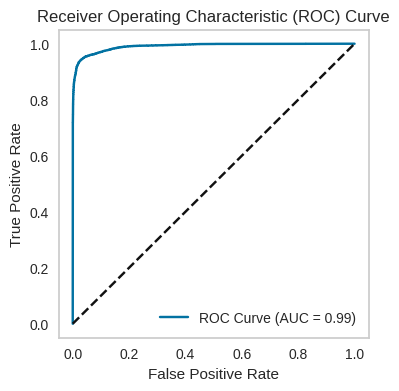

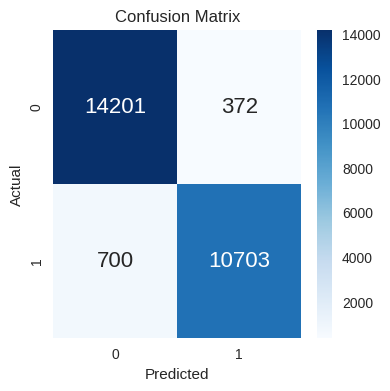

In [ ]:
# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## K-Nearest Neighbors Classifier

In [ ]:
knn = KNeighborsClassifier()
param_grid = {
    'n_neighbors': [3, 5, 7],
    'weights': ['uniform', 'distance'],
    'p': [1, 2],
}
grid_search = GridSearchCV(estimator=knn, param_grid=param_grid, cv=5)

grid_search.fit(x_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

Best Parameters: {'n_neighbors': 7, 'p': 1, 'weights': 'uniform'}
Best Score: 0.941034928044892


In [ ]:
knn = KNeighborsClassifier(n_neighbors= 7, p= 1, weights = 'uniform')
knn.fit(x_train, y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=7, p=1,
                     weights='uniform')

### Evaluating Model on valid

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

# Calculate metrics
y_val_pred = knn.predict(x_val)
cm = confusion_matrix(y_val, y_val_pred)
accuracy = accuracy_score(y_val, y_val_pred)
precision = precision_score(y_val, y_val_pred)
recall = recall_score(y_val, y_val_pred)
f1 = f1_score(y_val, y_val_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_val_prob = knn.predict_proba(x_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_val_prob)
auc = roc_auc_score(y_val, y_val_prob)

# Print the metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9438937542103744
Precision: 0.9592074592074592
Recall: 0.9097943842582357
F1 Score: 0.9338477249517757
Specificity: 0.9701772324471711
AUC: 0.9806656985028879


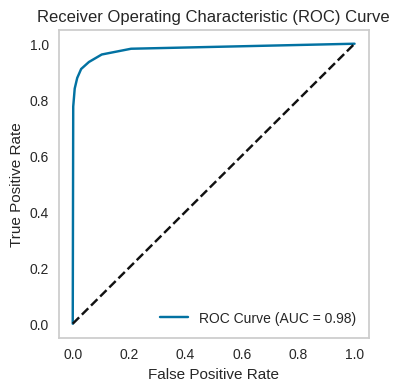

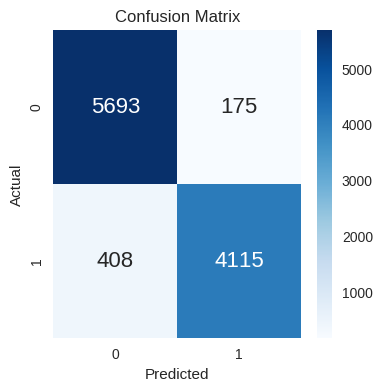

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Evaluating Model on test

In [ ]:
# Calculate metrics
y_test_pred = svc.predict(x_test)
cm = confusion_matrix(y_test, y_test_pred)
accuracy_knn = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_test_prob = svc.predict_proba(x_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
auc = roc_auc_score(y_test, y_test_prob)

# Print the metrics
print("Accuracy:", accuracy_knn)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9587311364336311
Precision: 0.9664108352144469
Recall: 0.9386126457949663
F1 Score: 0.9523089242815197
Specificity: 0.9744733411102724
AUC: 0.9909051924665451


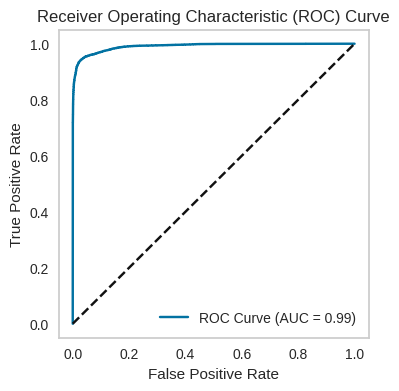

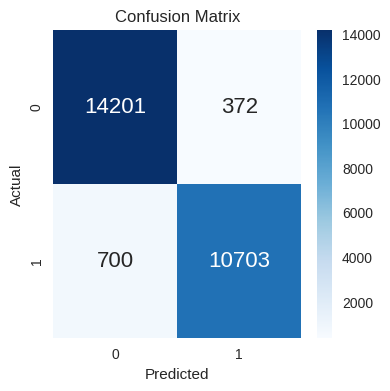

In [ ]:
# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## XGBClassifier tuning Hyper parameter

In [ ]:
XGB = XGBClassifier()
#tree_method='gpu_hist'
param_grid = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.1, 0.01, 0.001],
    'max_depth': [3, 4, 5],
    'gamma': [0, 0.1, 0.2]
}
grid_search = GridSearchCV(estimator=XGB, param_grid=param_grid, cv=3, n_jobs=1)
grid_search.fit(x_val, y_val)
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)


Best Parameters: {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 150}
Best Score: 0.9520742148884157


In [ ]:
XGB = XGBClassifier( gamma=0.2,learning_rate= 0.1, max_depth=5, n_estimators = 150, n_jobs=10)
XGB.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0.2, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=150, n_jobs=10, num_parallel_tree=None,
              objective='binary:logistic', predictor=None, ...)

### Evaluating Model on valid

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

# Calculate metrics
y_val_pred = XGB.predict(x_val)
cm = confusion_matrix(y_val, y_val_pred)
accuracy = accuracy_score(y_val, y_val_pred)
precision = precision_score(y_val, y_val_pred)
recall = recall_score(y_val, y_val_pred)
f1 = f1_score(y_val, y_val_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_val_prob = XGB.predict_proba(x_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_val_prob)
auc = roc_auc_score(y_val, y_val_prob)

# Print the metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9621788085843519
Precision: 0.9736238532110092
Recall: 0.9385363696661508
F1 Score: 0.9557581898007431
Specificity: 0.9804021813224267
AUC: 0.9940961262748407


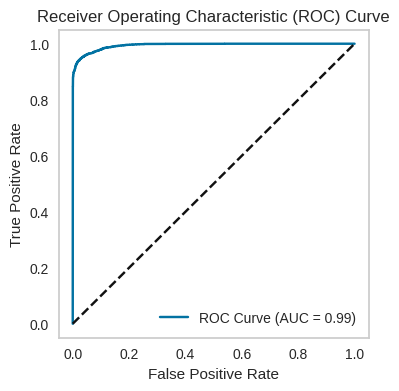

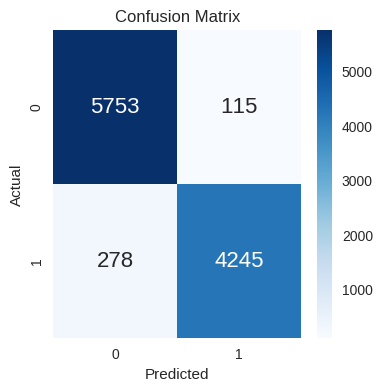

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Evaluating Model on test

In [ ]:
# Calculate metrics
y_test_pred = XGB.predict(x_test)
cm = confusion_matrix(y_test, y_test_pred)
accuracy_xgb = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_test_prob = XGB.predict_proba(x_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
auc = roc_auc_score(y_test, y_test_prob)

# Print the metrics
print("Accuracy:", accuracy_xgb)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9615029257776408
Precision: 0.9713638423198913
Recall: 0.9400157853196527
F1 Score: 0.9554327480167571
Specificity: 0.9783160639538874
AUC: 0.9941716645478579


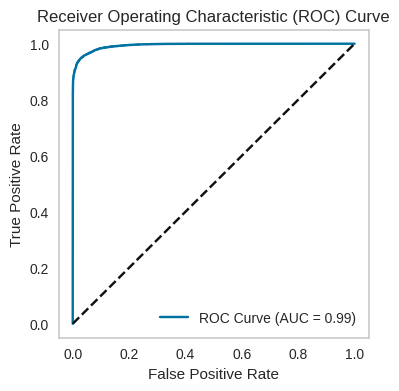

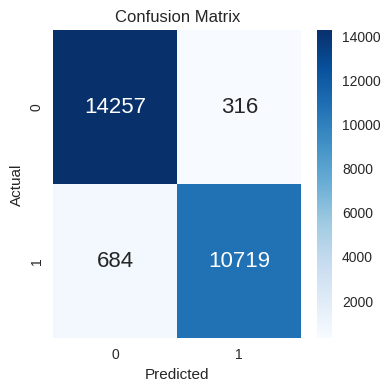

In [ ]:
# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

## MPLClassifier tuning Hyper parameter

In [82]:
param_grid = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50)],
    'activation': ['relu', 'logistic'],
    'solver': ['adam', 'sgd'],
    'alpha': [0.0001, 0.001, 0.01],
}
mlp = MLPClassifier(max_iter=50, random_state=42)

grid_search = GridSearchCV(mlp, param_grid, cv=3, n_jobs=20, verbose=2)
grid_search.fit(x_val, y_val)
print("Best Parameters:", grid_search.best_params_)
print("Best Score:", grid_search.best_score_)

Fitting 3 folds for each of 36 candidates, totalling 108 fits
Best Parameters: {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 50), 'solver': 'adam'}
Best Score: 0.937157283740997


In [84]:
mlp = MLPClassifier(activation = 'relu', alpha = 0.0001, hidden_layer_sizes =(50, 50), solver ='adam')
mlp.fit(x_train, y_train)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
              beta_2=0.999, early_stopping=False, epsilon=1e-08,
              hidden_layer_sizes=(50, 50), learning_rate='constant',
              learning_rate_init=0.001, max_fun=15000, max_iter=200,
              momentum=0.9, n_iter_no_change=10, nesterovs_momentum=True,
              power_t=0.5, random_state=None, shuffle=True, solver='adam',
              tol=0.0001, validation_fraction=0.1, verbose=False,
              warm_start=False)

### Evaluating Model on valid

In [90]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_curve, roc_auc_score

# Calculate metrics
y_val_pred = mlp.predict(x_val)
cm = confusion_matrix(y_val, y_val_pred)
accuracy_mlp = accuracy_score(y_val, y_val_pred)
precision = precision_score(y_val, y_val_pred)
recall = recall_score(y_val, y_val_pred)
f1 = f1_score(y_val, y_val_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_val_prob = mlp.predict_proba(x_val)[:, 1]
fpr, tpr, thresholds = roc_curve(y_val, y_val_prob)
auc = roc_auc_score(y_val, y_val_prob)

# Print the metrics
print("Accuracy:", accuracy_mlp)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9598691175055336
Precision: 0.9640596745027125
Recall: 0.9429582135750608
F1 Score: 0.9533921985022913
Specificity: 0.9729038854805726
AUC: 0.9939055341019264


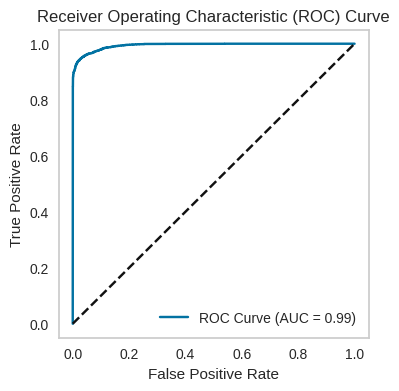

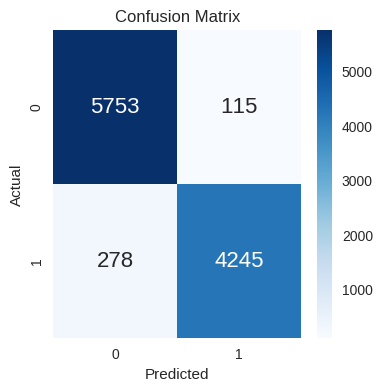

In [86]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


### Evaluating Model on test

In [89]:
# Calculate metrics
y_test_pred = mlp.predict(x_test)
cm = confusion_matrix(y_test, y_test_pred)
accuracy_mlp = accuracy_score(y_test, y_test_pred)
precision = precision_score(y_test, y_test_pred)
recall = recall_score(y_test, y_test_pred)
f1 = f1_score(y_test, y_test_pred)

# Calculate specificity
TN = cm[0, 0]
FP = cm[0, 1]
specificity = TN / (TN + FP)

# Calculate ROC curve and AUC
y_test_prob = mlp.predict_proba(x_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
auc = roc_auc_score(y_test, y_test_prob)

# Print the metrics
print("Accuracy:", accuracy_mlp)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Specificity:", specificity)
print("AUC:", auc)

Accuracy: 0.9571912534647367
Precision: 0.9609423989966854
Recall: 0.9407173550819959
F1 Score: 0.9507223256226182
Specificity: 0.9700816578604268
AUC: 0.9937800554603823


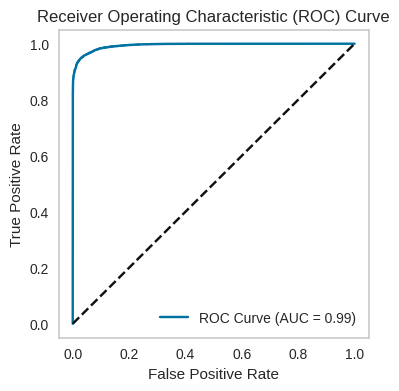

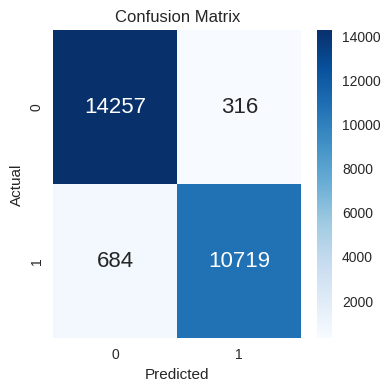

In [88]:

# Plot ROC curve
plt.figure(figsize=(4, 4))
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.grid()
plt.show()

# Plot Confusion Matrix
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', annot_kws={"size": 16})
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()